<a href="https://colab.research.google.com/github/rmesrobi/capstone_2/blob/main/rainforest_connection_species_final.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install -q kaggle

In [ ]:
! rm -rf sample_data

In [ ]:
from google.colab import files
from google.colab import drive

In [ ]:
files.upload()

Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"raffimesrobian","key":"cdd298a1a8ff82c8a1ed9c36cc3de5d4"}'}

In [ ]:
! mkdir ~/.kaggle

In [ ]:
! cp kaggle.json ~/.kaggle/
! chmod 600 ~/.kaggle/kaggle.json

In [ ]:
!pip install --upgrade kaggle

     |████████████████████████████████| 61kB 6.2MB/s 
  Created wheel for kaggle: filename=kaggle-1.5.10-cp36-none-any.whl size=73269 sha256=7ca3d99629c2f33ebe38b8e737f6234e0b0ee53d2146a12c7d7e530f7f587c5c
  Stored in directory: /root/.cache/pip/wheels/3a/d1/7e/6ce09b72b770149802c653a02783821629146983ee5a360f10
Successfully built kaggle
  Found existing installation: kaggle 1.5.9
    Uninstalling kaggle-1.5.9:
      Successfully uninstalled kaggle-1.5.9


In [ ]:
! kaggle competitions download -c rfcx-species-audio-detection

100% 49.6G/49.7G [11:22<00:00, 89.0MB/s]
100% 49.7G/49.7G [11:25<00:00, 77.8MB/s]


In [ ]:
! unzip rfcx-species-audio-detection.zip

Streaming output truncated to the last 5000 lines.
  inflating: test/e416a5eca.flac     
  inflating: test/e41b84fa7.flac     
  inflating: test/e45e758c1.flac     
  inflating: test/e4cb4370c.flac     
  inflating: test/e5078d068.flac     
  inflating: test/e50f9f241.flac     
  inflating: test/e512b33fb.flac     
  inflating: test/e52fe0b41.flac     
  inflating: test/e539e1a4d.flac     
  inflating: test/e53ef2a35.flac     
  inflating: test/e56187b03.flac     
  inflating: test/e56fb8264.flac     
  inflating: test/e57475890.flac     
  inflating: test/e5848e7db.flac     
  inflating: test/e5880f75c.flac     
  inflating: test/e5b87fda5.flac     
  inflating: test/e5ed0271d.flac     
  inflating: test/e6353d64a.flac     
  inflating: test/e68644d1e.flac     
  inflating: test/e6cb26296.flac     
  inflating: test/e751d4faa.flac     
  inflating: test/e7acab4ef.flac     
  inflating: test/e80456d8d.flac     
  inflating: test/e81a06c38.flac     
  inflating: test/e82c2e698.flac     

In [ ]:
! rm rfcx-species-audio-detection.zip

In [159]:
import os
from os import path
from tqdm.notebook import tqdm
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
# from matplotlib import rcParams
# rcParams.update({'figure.autolayout': True})
import matplotlib.patches as patches
import seaborn as sns
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score
import librosa
import librosa.display
import IPython.display as ipd
from skimage.transform import resize
from PIL import Image
import warnings
warnings.filterwarnings('ignore')
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential

In [ ]:
train_df = pd.read_csv('/content/train_tp.csv')
train_fp = pd.read_csv('/content/train_fp.csv')

In [ ]:
drop_songs = train_df[(train_df.songtype_id == 4)].index
train_df.drop(drop_songs, inplace = True)

In [ ]:
def get_data(filename):
  '''Pulls data from pandas dataframe - data used during image generation'''
  recording_id = filename.iloc[0]
  species_id = filename.iloc[1]
  t_min, t_max = filename.iloc[3], filename.iloc[5]
  name = str(species_id) + '_' + str(recording_id)
  return species_id, recording_id, name, t_min, t_max

def read_flac_file(recording_id):
  '''loads data from audio file - numpy array and sample rate'''
  #sr = None to load in default 44100 hz
  data, samplerate = librosa.load('/content/train/' + recording_id + '.flac', sr = None)
  return data, samplerate

def read_flac_file_test(recording_id):
  '''loads data from test flacs'''
  data, samplerate = librosa.load('/content/test/' + recording_id + '.flac', sr = None)
  return data, samplerate

def plot_spec(filename):
  '''Plot spectrogram with Mel scaling'''
  species_id, recording_id, name, t_min, t_max = get_data(filename)
  data, sr = read_flac_file(recording_id)
  #creates clip of data between t_min and t_max
  clip = data[int(t_min * sr): int(t_max * sr)]
  spec = librosa.feature.melspectrogram(clip, sr = sr)
  spec = librosa.power_to_db(spec, ref = np.max)
  librosa.display.specshow(spec, sr = sr, x_axis = 'time', y_axis = 'mel')

def save_spec(filename):
  '''Plot spectrogram with Mel scaling'''
  species_id, recording_id, name, t_min, t_max = get_data(filename)
  data, sr = read_flac_file(recording_id)
  #creates clip of data between t_min and t_max
  # clip = data[int(t_min * sr): int(t_max * sr)]
  spec = librosa.feature.melspectrogram(data, sr = sr)
  spec = librosa.power_to_db(spec, ref = np.max)
  librosa.display.specshow(spec, sr = sr, x_axis = 'time', y_axis = 'mel')
  plt.title('Mel Spectrogram: ' + str(species_id))
  plt.colorbar(format = '%+2.0f dB')
  plt.savefig('spec_' + str(species_id))
  plt.close()

def create_spec(filename):
  plt.interactive(False)
  fig, ax = plt.subplots(figsize = (3,3))
  ax.get_xaxis().set_visible(False)
  ax.get_yaxis().set_visible(False)
  ax.set_frame_on(False)
  species_id, recording_id, name, t_min, t_max = get_data(filename)
  data, sr = read_flac_file(recording_id)
  #creates clip of data between t_min and t_max
  clip = data[int(t_min * sr): int(t_max * sr)]
  spec = librosa.feature.melspectrogram(clip, sr = sr)
  spec = librosa.power_to_db(spec, ref = np.max)
  librosa.display.specshow(spec, sr = sr, x_axis = 'time', y_axis = 'mel')
  path = 'tp_images/'
  save_name = str(name) + '.jpg'
  plt.savefig(path + str(species_id) + '/' + save_name, dpi = 400, bbox_inches = 'tight', pad_inches = 0)
  plt.close()
  fig.clf()
  plt.close(fig)
  plt.close('all')
  del path, save_name, filename, data, fig, ax, spec

def create_spec_train_val(filename):
  plt.interactive(False)
  fig, ax = plt.subplots(figsize = (3,3))
  ax.get_xaxis().set_visible(False)
  ax.get_yaxis().set_visible(False)
  ax.set_frame_on(False)
  species_id, recording_id, name, t_min, t_max = get_data(filename)
  data, sr = read_flac_file(recording_id)
  #creates clip of data between t_min and t_max
  clip = data[int(t_min * sr): int(t_max * sr)]
  spec = librosa.feature.melspectrogram(clip, sr = sr)
  spec = librosa.power_to_db(spec, ref = np.max)
  librosa.display.specshow(spec, sr = sr, x_axis = 'time', y_axis = 'mel')
  path = 'train_val_images/'
  save_name = str(name) + '.jpg'
  plt.savefig(path + str(species_id) + '/' + save_name, dpi = 400, bbox_inches = 'tight', pad_inches = 0)
  plt.close()
  fig.clf()
  plt.close(fig)
  plt.close('all')
  del path, save_name, filename, data, fig, ax, spec

def create_spec_test(filename):
  plt.interactive(False)
  fig, ax = plt.subplots(figsize = (3,3))
  ax.get_xaxis().set_visible(False)
  ax.get_yaxis().set_visible(False)
  ax.set_frame_on(False)
  species_id, recording_id, name, t_min, t_max = get_data(filename)
  data, sr = read_flac_file(recording_id)
  #creates clip of data between t_min and t_max
  clip = data[int(t_min * sr): int(t_max * sr)]
  spec = librosa.feature.melspectrogram(clip, sr = sr)
  spec = librosa.power_to_db(spec, ref = np.max)
  librosa.display.specshow(spec, sr = sr, x_axis = 'time', y_axis = 'mel')
  path = 'test_images/'
  save_name = str(name) + '.jpg'
  plt.savefig(path + str(species_id) + '/' + save_name, dpi = 400, bbox_inches = 'tight', pad_inches = 0)
  plt.close()
  fig.clf()
  plt.close(fig)
  plt.close('all')
  del path, save_name, filename, data, fig, ax, spec

def spec_img_label(id):
  plt.interactive(False)
  fig, ax = plt.subplots(figsize = (3,3))
  ax.get_xaxis().set_visible(False)
  ax.get_yaxis().set_visible(False)
  ax.set_frame_on(False)
  species_id, recording_id, name, t_min, t_max = get_data(train_df['recording_id'] == id)
  data, sr = read_flac_file(id)
  clip = data[int(t_min * sr): int(t_max * sr)]
  spec = librosa.power_to_db(librosa.feature.melspectrogram(clip, sr = sr), ref = np.max)
  image = librosa.display.specshow(spec, sr = sr, x_axis = 'time', y_axis = 'mel')
  return image

def plot_audio_file(data, samplerate, t_min, t_max, species):
    '''Plot the slice for the species label'''
    sr = samplerate
    fig, ax = plt.subplots(figsize = (8,4))
    x = range(len(data))
    y = data
    plt.plot(x, y)
    x = range(int(t_min * sr), int(t_max * sr))
    y = data[int(t_min * sr): int(t_max * sr)]
    plt.plot(x, y, color = 'r', label = 'species: ' + str(species))
    plt.ylabel('amplitude')
    plt.xlabel('time')
    plt.legend(loc = 'upper center')
    plt.grid()

def save_wavefile(data, samplerate, t_min, t_max, species):
    '''Plot the slice for the species label'''
    sr = samplerate
    fig, ax = plt.subplots(figsize = (8,4))
    x = range(len(data))
    y = data
    plt.plot(x, y)
    x = range(int(t_min * sr), int(t_max * sr))
    y = data[int(t_min * sr): int(t_max * sr)]
    plt.plot(x, y, color = 'r', label = 'species: ' + str(species))
    plt.legend(loc = 'upper center')
    plt.grid()
    plt.savefig('waveplot_' + str(species))
    plt.close()

In [ ]:
! mkdir train_val_images
! mkdir test_images

In [ ]:
X = train_df.copy()
Y = train_df['species_id']
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size = .2, stratify = Y)

In [ ]:
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((870, 7), (218, 7), (870,), (218,))

In [ ]:
#create train_val spectrogram images on X_train
for i in tqdm(range(len(X_train))):
  create_spec_train_val(X_train.iloc[i])

In [ ]:
#create test spectrogram images on X_test
for i in tqdm(range(len(X_test))):
  create_spec_test(X_test.iloc[i])

In [ ]:
! rm -rf train_val_images/.ipynb_checkpoints/
! rm -rf test_images/.ipynb_checkpoints/

In [ ]:
#create a dataset
data_dir = 'train_val_images/'
test_dir = 'test_images/'
batch_size = 32
img_height = 180
img_width = 180

train_ds = tf.keras.preprocessing.image_dataset_from_directory(
    data_dir,
    validation_split = 0.2,
    subset = 'training',
    seed = 123,
    image_size = (img_height, img_width),
    batch_size = batch_size)

val_ds = tf.keras.preprocessing.image_dataset_from_directory(
    data_dir,
    validation_split = 0.2,
    subset = 'validation',
    seed = 123,
    image_size = (img_height, img_width),
    batch_size = batch_size)

test_ds = tf.keras.preprocessing.image_dataset_from_directory(
    test_dir,
    seed = 123,
    image_size = (img_height, img_width),
    batch_size = 215)



Found 848 files belonging to 24 classes.
Using 679 files for training.
Found 848 files belonging to 24 classes.
Using 169 files for validation.
Found 215 files belonging to 24 classes.


In [ ]:
#check for the correct amount of classes in class_names
class_names = train_ds.class_names
# class_names

In [70]:
plt.figure(figsize=(14, 14))
for images, labels in train_ds.take(1):
  for i in range(12):
    ax = plt.subplot(4, 4, i + 1)
    plt.imshow(images[i].numpy().astype("uint8"))
    plt.title(class_names[labels[i]])
    plt.axis("off")
  # plt.show()
  plt.savefig('spec_grid.png')
  plt.close();

In [ ]:
#dataset configuration

AUTOTUNE = tf.data.experimental.AUTOTUNE

train_ds = train_ds.cache().shuffle(1000).prefetch(buffer_size = AUTOTUNE)
val_ds = val_ds.cache().prefetch(buffer_size = AUTOTUNE)

In [ ]:
#standardizing the data

normalization_layer = layers.experimental.preprocessing.Rescaling(1./255)

In [81]:
#creating model

num_classes = 24

model = Sequential([
                    layers.experimental.preprocessing.Rescaling(1./255, input_shape = (img_height, img_width, 3)),
                    layers.Conv2D(16, 3, padding = 'same', activation = 'relu'),
                    layers.MaxPooling2D(),
                    # layers.Dropout(0.1),
                    layers.Conv2D(32, 3, padding = 'same', activation = 'relu'),
                    layers.MaxPooling2D(),
                    # layers.Dropout(0.1),
                    layers.Conv2D(64, 3, padding = 'same', activation = 'relu'),
                    layers.MaxPooling2D(),
                    # layers.Dropout(0.1),
                    layers.Flatten(),
                    layers.Dense(128, activation = 'relu'),
                    layers.Dense(num_classes, activation = 'softmax')
                    ])

In [82]:
#compile model

model.compile(optimizer = keras.optimizers.Adam(),
              loss = tf.keras.losses.SparseCategoricalCrossentropy(),
              metrics = ['accuracy'])

In [83]:
model.summary()

Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
rescaling_4 (Rescaling)      (None, 180, 180, 3)       0         
_________________________________________________________________
conv2d_9 (Conv2D)            (None, 180, 180, 16)      448       
_________________________________________________________________
max_pooling2d_9 (MaxPooling2 (None, 90, 90, 16)        0         
_________________________________________________________________
conv2d_10 (Conv2D)           (None, 90, 90, 32)        4640      
_________________________________________________________________
max_pooling2d_10 (MaxPooling (None, 45, 45, 32)        0         
_________________________________________________________________
conv2d_11 (Conv2D)           (None, 45, 45, 64)        18496     
_________________________________________________________________
max_pooling2d_11 (MaxPooling (None, 22, 22, 64)       

In [84]:
#train model

epochs = 15
history = model.fit(
    train_ds,
    validation_data = val_ds,
    epochs = epochs
    )

Epoch 1/15
22/22 [==============================] - 0s 17ms/step - loss: 2.9372 - accuracy: 0.1311 - val_loss: 2.2436 - val_accuracy: 0.3728
Epoch 2/15
22/22 [==============================] - 0s 11ms/step - loss: 1.7766 - accuracy: 0.4816 - val_loss: 1.5947 - val_accuracy: 0.6036
Epoch 3/15
22/22 [==============================] - 0s 11ms/step - loss: 0.9348 - accuracy: 0.7261 - val_loss: 1.0723 - val_accuracy: 0.7160
Epoch 4/15
22/22 [==============================] - 0s 11ms/step - loss: 0.4596 - accuracy: 0.8675 - val_loss: 0.9554 - val_accuracy: 0.7396
Epoch 5/15
22/22 [==============================] - 0s 11ms/step - loss: 0.2045 - accuracy: 0.9396 - val_loss: 0.8174 - val_accuracy: 0.7574
Epoch 6/15
22/22 [==============================] - 0s 11ms/step - loss: 0.1799 - accuracy: 0.9529 - val_loss: 0.6997 - val_accuracy: 0.8225
Epoch 7/15
22/22 [==============================] - 0s 12ms/step - loss: 0.0671 - accuracy: 0.9750 - val_loss: 0.9655 - val_accuracy: 0.7692
Epoch 8/15
22

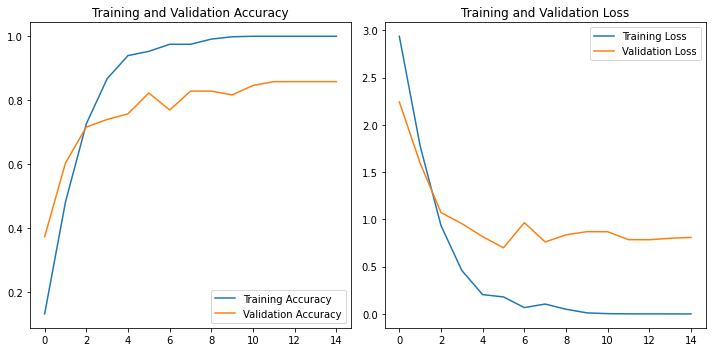

In [85]:
#visualize training results

acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(epochs)

plt.figure(figsize = (10,5))
plt.subplot(1,2,1)
plt.plot(epochs_range, acc, label = 'Training Accuracy')
plt.plot(epochs_range, val_acc, label = 'Validation Accuracy')
plt.legend(loc = 'lower right')
plt.autoscale()
plt.title('Training and Validation Accuracy')

plt.subplot(1,2,2)
plt.plot(epochs_range, loss, label = 'Training Loss')
plt.plot(epochs_range, val_loss, label = 'Validation Loss')
plt.legend(loc = 'upper right')
plt.title('Training and Validation Loss')
plt.autoscale()
plt.show();

In [86]:
#test model
model.evaluate(test_ds)

1/1 [==============================] - 0s 2ms/step - loss: 0.7634 - accuracy: 0.8605


[0.7634393572807312, 0.8604651093482971]

In [88]:
for x, label in tqdm(test_ds.take(1)):
  numpy_x = x.numpy()
  numpy_label = label.numpy()

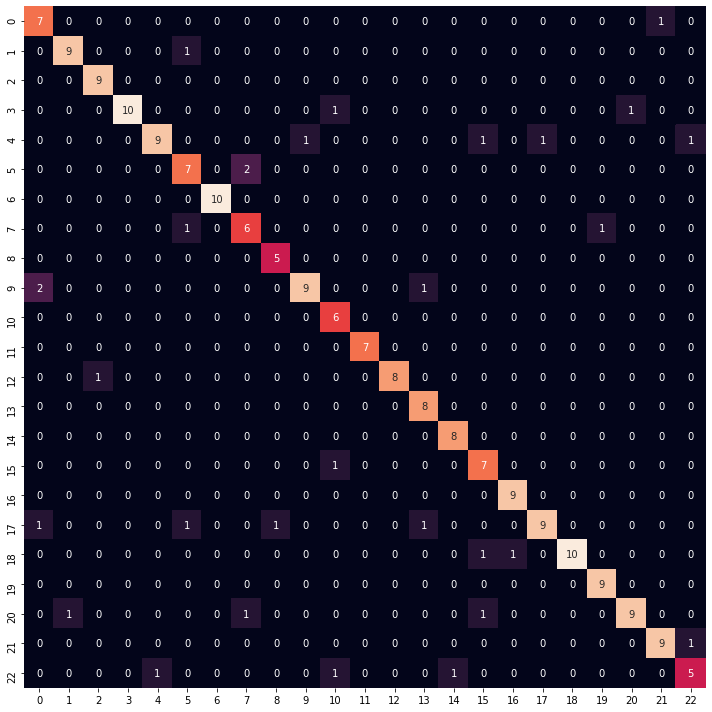

In [91]:
y_true = numpy_label
y_pred = model.predict(numpy_x).argmax(axis = 1)
mat = confusion_matrix(y_true, y_pred)
fig, ax = plt.subplots(figsize = (10,10))
sns.heatmap(mat.T, square = True, annot = True, fmt = 'd', cbar = False)
plt.show();

In [164]:
train_df[train_df['species_id'] == 9][0:1]

,recording_id,species_id,songtype_id,t_min,f_min,t_max,f_max
51,0ab6aa734,9,1,49.4773,843.75,53.04,5718.75


In [166]:
train_df[train_df['species_id'] == 0][0:1]

,recording_id,species_id,songtype_id,t_min,f_min,t_max,f_max
6,00d442df7,0,1,19.3653,5906.25,20.16,8250.0


In [165]:
ipd.Audio('train/0ab6aa734.flac')

In [167]:
ipd.Audio('train/00d442df7.flac')

In [156]:
species_id, recording_id, name, t_min, t_max = get_data(train_df.iloc[6])
data, sr = read_flac_file(recording_id)

D = librosa.amplitude_to_db(np.abs(librosa.stft(data)), ref=np.max)
librosa.display.specshow(D, sr = sr, x_axis = 'time', y_axis = 'linear')
plt.colorbar(format = '%+2.0f dB')
plt.title('Spectrogram for Recording ID: ' + str(recording_id))
plt.savefig('spec_example')
plt.close()
# plt.show();

In [157]:
hop_length = 1024
D = librosa.amplitude_to_db(np.abs(librosa.stft(data, hop_length=hop_length)),
                            ref=np.max)
librosa.display.specshow(D, y_axis='log', sr=sr, hop_length=hop_length,
                         x_axis='time')
plt.colorbar(format = '%+2.0f dB')
plt.title('Spectrogram (log scale) for Recording ID: ' + str(recording_id))
plt.savefig('spec_log_example')
plt.close()
# plt.show();

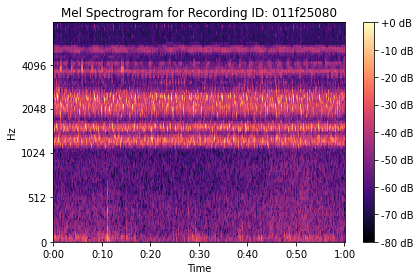

In [180]:
S = librosa.feature.melspectrogram(data, sr=sr, n_mels=128,
                                    fmax=8000)
S_dB = librosa.power_to_db(S, ref=np.max)
librosa.display.specshow(S_dB, x_axis='time',
                         y_axis='mel', sr=sr,
                         fmax=8000)
plt.colorbar(format = '%+2.0f dB')
plt.title('Mel Spectrogram for Recording ID: ' + str(recording_id))
# plt.savefig('mel_spec_example')
# plt.close()
plt.show();

In [191]:
mfccs = librosa.feature.mfcc(data, sr=sr, n_mfcc= 50)

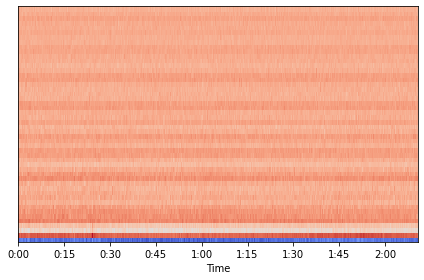

In [192]:
librosa.display.specshow(mfccs, x_axis = 'time')
plt.show();

In [193]:
m_slaney = librosa.feature.mfcc(data, sr=sr, dct_type=2)
m_htk = librosa.feature.mfcc(data, sr=sr, dct_type=3)

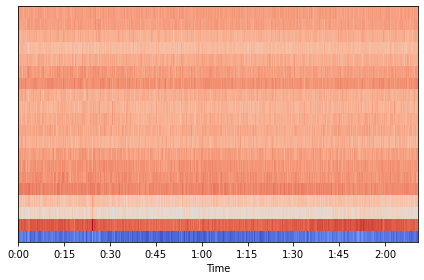

In [194]:
librosa.display.specshow(m_slaney, x_axis = 'time')
plt.show();

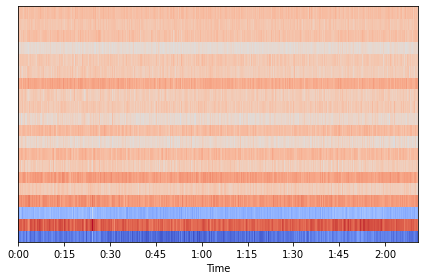

In [195]:
librosa.display.specshow(m_htk, x_axis = 'time')
plt.show();

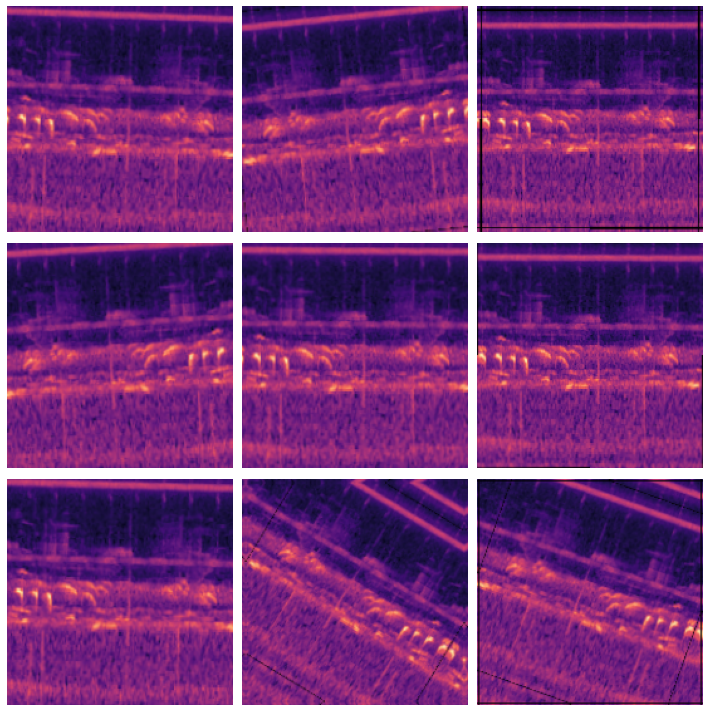

In [173]:
#data augmentation

data_augmentation = keras.Sequential(
    [
     layers.experimental.preprocessing.RandomFlip('horizontal',
                                                  input_shape = (img_height, img_width, 3)),
     layers.experimental.preprocessing.RandomRotation(0.1),
     layers.experimental.preprocessing.RandomZoom(0.1),
    ])

plt.figure(figsize = (10,10))
for images, _ in train_ds.take(1):
  for i in range(9):
    augmented_images = data_augmentation(images)
    ax = plt.subplot(3,3, i + 1)
    plt.imshow(augmented_images[0].numpy().astype('uint8'))
    plt.axis('off')
  plt.show();

In [174]:
#creating new dropout model w / augmented images

dropout_model = Sequential([
                    data_augmentation,
                    layers.experimental.preprocessing.Rescaling(1./255),
                    layers.Conv2D(16, 3, padding = 'same', activation = 'relu'),
                    layers.MaxPooling2D(),
                    layers.Conv2D(32, 3, padding = 'same', activation = 'relu'),
                    layers.MaxPooling2D(),
                    layers.Conv2D(64, 3, padding = 'same', activation = 'relu'),
                    layers.MaxPooling2D(),
                    layers.Dropout(0.2),
                    layers.Flatten(),
                    layers.Dense(128, activation = 'relu'),
                    layers.Dense(num_classes, activation = 'softmax')
                  ])

In [175]:
#compile dropout model

dropout_model.compile(optimizer = 'adam',
              loss = tf.keras.losses.SparseCategoricalCrossentropy(),
              metrics = ['accuracy'])

In [176]:
#fit dropout model

epochs = 100
history = dropout_model.fit(
    train_ds,
    validation_data = val_ds,
    epochs = epochs
    )

Epoch 1/100
22/22 [==============================] - 0s 21ms/step - loss: 3.1577 - accuracy: 0.0574 - val_loss: 3.0012 - val_accuracy: 0.0828
Epoch 2/100
22/22 [==============================] - 0s 14ms/step - loss: 2.8580 - accuracy: 0.1429 - val_loss: 2.7547 - val_accuracy: 0.2367
Epoch 3/100
22/22 [==============================] - 0s 14ms/step - loss: 2.4786 - accuracy: 0.2489 - val_loss: 2.2515 - val_accuracy: 0.3314
Epoch 4/100
22/22 [==============================] - 0s 14ms/step - loss: 2.2819 - accuracy: 0.3108 - val_loss: 2.1311 - val_accuracy: 0.3077
Epoch 5/100
22/22 [==============================] - 0s 14ms/step - loss: 2.0065 - accuracy: 0.3770 - val_loss: 2.1076 - val_accuracy: 0.3669
Epoch 6/100
22/22 [==============================] - 0s 14ms/step - loss: 1.8164 - accuracy: 0.4639 - val_loss: 1.7903 - val_accuracy: 0.4675
Epoch 7/100
22/22 [==============================] - 0s 14ms/step - loss: 1.6424 - accuracy: 0.5022 - val_loss: 1.6838 - val_accuracy: 0.5207
Epoch 

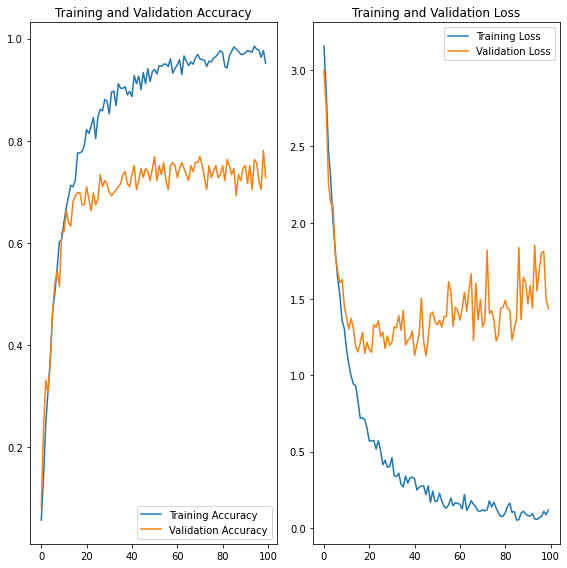

In [177]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(epochs)

plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

In [179]:
#test model
dropout_model.evaluate(test_ds)

1/1 [==============================] - 0s 3ms/step - loss: 1.5662 - accuracy: 0.7349


[1.5662018060684204, 0.734883725643158]